<a href="https://colab.research.google.com/github/zahemen9900/YouTube-Analytics-App/blob/main/YouTube_Data_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<div style = "font-family: 'Arial', 'sans-serif'; text-align: center; color : brown; border-color: black; font-size: 30px;">
    <h1><b>YouTuber Streamer Analysis</b></h1>
</div>

> ![YouTube Analytics fig](https://api.backlinko.com/app/uploads/2021/01/youtube-users-960x502.webp)

<h1 style="color: #e44d26; font-family: Arial, Helvetica, sans-serif; text-align: center;"><b>YouTube Channel Analysis</b></h1>
<p style="color: #333; font-family: Arial, Helvetica, sans-serif; font-size: 18px; text-align: justify; margin-bottom: 15px;">YouTube is one of the most popular online platforms for video content creation and consumption. Millions of users upload, watch, like, comment, and subscribe to various channels on YouTube every day. In this project, we will explore the trend on the top 100 YouTube channels and analyze their subscriber count, category of videos, number of views, likes, and comments. We will use data from the <a href="^1^" style="color: #e44d26;">YouTube API</a> to collect information about the channels and their videos. We will also use <a href="^2^" style="color: #e44d26;">Python</a> and <a href="^3^" style="color: #e44d26;">Pandas</a> to manipulate and visualize the data.</p>
<p style="color: #333; font-family: Arial, Helvetica, sans-serif; font-size: 18px; text-align: justify; margin-bottom: 15px; background-color: #e6f7ff; padding: 10px; border-radius: 5px;">Some of the questions we will try to answer in this project are:</p>
<ul style="color: #333; font-family: Arial, Helvetica, sans-serif; font-size: 18px;">
    <li style="color: #4285f4; font-size: 1.2em;">Which are the most popular channels in terms of subscribers, views, likes, and comments?</li>
    <li style="color: #4285f4; font-size: 1.2em;">Which categories of videos are the most common among the top 100 channels?</li>
    <li style="color: #4285f4; font-size: 1.2em;">How does the number of videos uploaded by a channel affect its popularity?</li>
    <li style="color: #4285f4; font-size: 1.2em;">What are the characteristics of the most engaging channels?</li>
    <li style="color: #4285f4; font-size: 1.2em;">How does the length, title, description, and thumbnail of a video influence its performance?</li>
</ul>
<p style="color: #333; font-family: Arial, Helvetica, sans-serif; font-size: 18px; text-align: justify; margin-bottom: 15px;">By the end of this project, we will have a better understanding of the YouTube landscape and the factors that contribute to the success of a channel or a video.
</p>

## <div style = "font-family: 'Arial', 'sans-serif'; text-align: center; color : black; border-color: black; font-size: 20px;"><h1><b>Part 1: Understanding the Data ✅</b></h1></div>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style('white')
plt.rc('figure', autolayout = True)
plt.rc(
    'axes',
    labelweight = 'bold',
    labelsize = 'large',
    titleweight = 'bold',
    titlesize = 14,
    titlepad = 10
)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

def style_df(df: pd.core.frame.DataFrame):
    try:
        return df.style.set_table_styles([
    {'selector': 'thead th', 'props': [('background-color', 'gray'), ('color', 'white')]},
    {'selector': 'tbody tr:nth-child(even)', 'props': [('background-color', '#f2f2f2')]},
    {'selector': 'tbody tr:nth-child(odd)', 'props': [('background-color', 'white')]}
])
    except Exception as e:
        return e



In [ ]:
df = pd.read_csv(
    r"C:\Users\David Yeboah\Downloads\youtubers_df.csv",
    usecols = ['Rank', 'Username', 'Categories', 'Suscribers', 'Country', 'Visits', 'Likes'],
    index_col = 'Rank'
)
df.rename(columns = {'Suscribers': 'Subscribers'}, inplace = True)

style_df(df.head())

,Username,Categories,Subscribers,Country,Visits,Likes
Rank,,,,,,
1,tseries,Música y baile,249500000,India,86200.000000,2700
2,MrBeast,"Videojuegos, Humor",183500000,Estados Unidos,117400000.000000,5300000
3,CoComelon,Educación,165500000,Unknown,7000000.000000,24700
4,SETIndia,nan,162600000,India,15600.000000,166
5,KidsDianaShow,"Animación, Juguetes",113500000,Unknown,3900000.000000,12400


In [ ]:

style_df(df.describe())

,Subscribers,Visits,Likes
count,1000.000000,1000.000000,1000.000000
mean,21894400.000000,1209446.315500,53632.592000
std,16827752.728808,5229942.255699,258045.689522
min,11700000.000000,0.000000,0.000000
25%,13800000.000000,31975.000000,471.750000
50%,16750000.000000,174450.000000,3500.000000
75%,23700000.000000,865475.000000,28650.000000
max,249500000.000000,117400000.000000,5300000.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1000 entries, 1 to 1000
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Username     1000 non-null   object 
 1   Categories   694 non-null    object 
 2   Subscribers  1000 non-null   int64  
 3   Country      1000 non-null   object 
 4   Visits       1000 non-null   float64
 5   Likes        1000 non-null   int64  
dtypes: float64(1), int64(2), object(3)
memory usage: 54.7+ KB


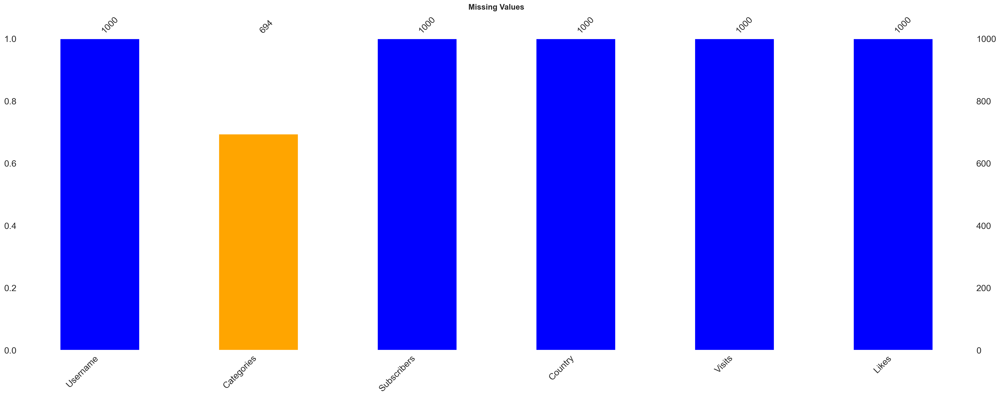

In [ ]:
import missingno as msno

color_palette = ['orange' if df[col].isnull().any() else 'blue' for col in df.columns]

plt.title('Missing Values')
msno.bar(df, color = color_palette)


In [ ]:
style_df(df[df.columns[df.isnull().any()]].head())

,Categories
Rank,
1,Música y baile
2,"Videojuegos, Humor"
3,Educación
4,nan
5,"Animación, Juguetes"


<Axes: >

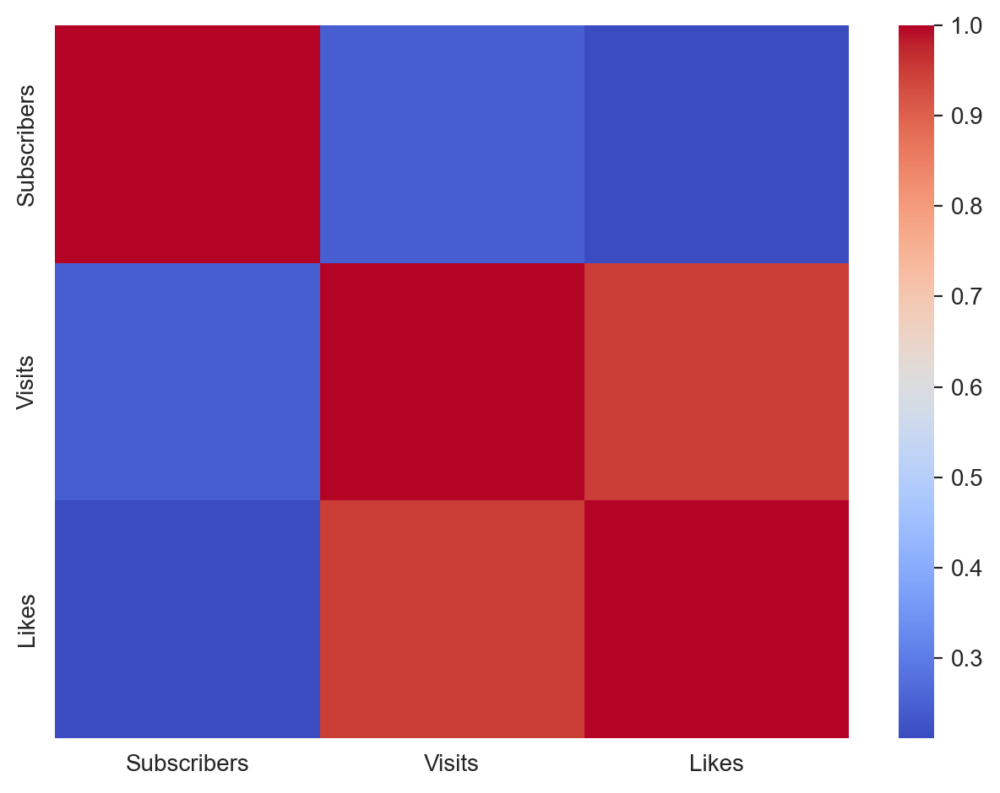

In [ ]:
numericals = df.select_dtypes(include = ['number'])

sns.heatmap(numericals.corr(), cmap = 'coolwarm')

In [ ]:
0.25e8

25000000.0

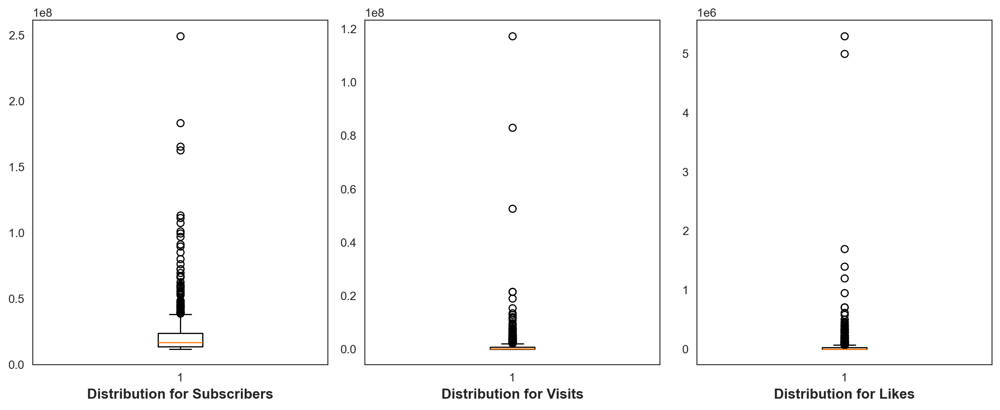

In [ ]:
fig, axes = plt.subplots(1, 3, figsize = (12, 5))

for col, ax in zip(numericals.columns, axes.flat):
    ax.boxplot(numericals[col])
    ax.set_xlabel('Distribution for {}'.format(col))

plt.tight_layout()

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p>We can see from the diagram above how the Metrics: <b>Subscribers, Visits & Likes</b>, are distributed:</p>
    <p>Channels have about 20 million subscribers on average, with some going well into a hundred million subscribers, with the top performing channels having over 150 million subscribers;</p>
    <p>Most channels have also had about 10 million visits on average, with the highest performers going into over 40 million + visits;</p>
    <p>Most of these channels would also have about 100,000 likes on average, with the higheest ones having millions of likes</p>
</div>

In [ ]:
# Removing the outliers in the numerical columns
def remove_outliers(df : pd.core.frame.DataFrame):
    try:
        if df.__class__ != pd.core.frame.DataFrame:
            raise ValueError('Error: Check that input is a dataframe')

        df_copy = df.copy()
        for col in df_copy.select_dtypes(include = ['number']):
            Q1 = df_copy[col].quantile(0.25)
            Q3 = df_copy[col].quantile(0.75)
            IQR = Q3 - Q1
            outliers = df_copy.loc[(df_copy[col] > (Q3 + 1.5 * IQR)) | (df_copy[col] < (Q1 - 1.5 * IQR))]
            df_copy.drop(outliers.index, inplace = True)

        return df_copy

    except TypeError as t:
        return str(t)



In [ ]:
df_out = remove_outliers(df)
df_out.shape

(685, 6)

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <!-- Put your content here -->
  <p>Technically there are a lot of outliers in the data, but that reduces our dataset by about <b>32%</b>, which could impact our analysis negatively.</p>
    <p>Thus to ensure a more accurate analysis, we will use manual removal based on the boxplot</p>
</div>

In [ ]:
df_  = df.copy()  #keeping a copy for some analysis later
outliers = df.loc[
    (df['Subscribers'] > 1.5e8) |
    (df['Visits'] > 0.4e8) |
    (df['Likes'] > 4e6)
]
df.drop(outliers.index, inplace = True)
df.shape

(994, 6)

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <!-- Put your content here -->
  <p>Now we have a lot more values to use for analysis.</p>
</div>

In [ ]:
for col in ['Categories', 'Country']:
    print(f'\033[1;34m{col}\033[0m  : \n{", ".join(map(str, df[col].unique()))} \n\n')

Categories  : 
Animación, Juguetes, Películas, Videojuegos, Juguetes, Música y baile, Videojuegos, nan, Películas, Animación, Películas, Noticias y Política, Educación, Animación, Humor, Música y baile, Animación, Música y baile, Películas, Películas, Juguetes, Películas, Humor, Vlogs diarios, Videojuegos, Juguetes, Animación, Videojuegos, Animación, Música y baile, Humor, Videojuegos, Humor, Diseño/arte, DIY y Life Hacks, Ciencia y tecnología, Fitness, Salud y autoayuda, Belleza, Moda, Humor, Comida y bebida, Deportes, Fitness, Viajes, Espectáculos, Comida y bebida, Salud y autoayuda, Diseño/arte, DIY y Life Hacks, Juguetes, Educación, Juguetes, Juguetes, Coches y vehículos, Música y baile, Juguetes, Animales y mascotas, ASMR, Moda, DIY y Life Hacks, Diseño/arte, Belleza, Coches y vehículos, Animación, Humor, Juguetes, ASMR, Comida y bebida, Comida y bebida, Juguetes, Juguetes, DIY y Life Hacks 


Country  : 
Unknown, Estados Unidos, India, Brasil, México, Rusia, Pakistán, Filipinas, 

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <!-- Put your content here -->
  <p>We can see that the values in the Categories and Country column are in Spanish. So we can try converting the values into English.</p>
</div>

In [ ]:
# decorator to check execution time
import time

def exec_time(func):
    def wrapper(*args, **kwargs):
        start_time = time.time()
        result = func(*args, **kwargs)
        end_time = time.time()
        print(f'{func.__name__} took {(end_time - start_time):.3f}s to execute')
        return result
    return wrapper


In [ ]:
from translate import Translator

@exec_time
def translate_with_retry(text, from_lang='es'):
    max_retries = 3
    retries = 0

    # Check for NaN values and skip translation for them
    if pd.isnull(text):
        return np.nan

    # Convert the text to a string
    text = str(text)

    while retries < max_retries:
        try:
            translator = Translator(from_lang=from_lang, to_lang='en')
            return translator.translate(text)
        except Exception as e:
            print(f"Error: {e}. Retrying...")
            retries += 1

    raise Exception("Translation failed after multiple retries.")


In [ ]:
translate_with_retry('Amigos')

translate_with_retry took 1.403s to execute


'Friends'

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <!-- Put your content here -->
  <p>From the data, translation times may vary, but it would take anywhere between <b>2 seconds</b> and <b>4.5 seconds</b> to execute one translation. It would therefore take a long time to execute all the <b>990+</b> rows, which wouldn't be the most practical approach.</p>
  <p> Thus we will use batch translation with dictionaries</p>
</div>

In [ ]:
category_translation_dict = {
    'Animación, Juguetes': 'Animation, Toys',
    'Películas, Videojuegos': 'Movies, Video Games',
    'Juguetes': 'Toys',
    'Música y baile': 'Music and Dance',
    'Videojuegos': 'Video Games',
    'Películas, Animación': 'Movies, Animation',
    'Películas': 'Movies',
    'Noticias y Política': 'News and Politics',
    'Educación': 'Education',
    'Animación, Humor': 'Animation, Comedy',
    'Música y baile, Animación': 'Music and Dance, Animation',
    'Música y baile, Películas': 'Music and Dance, Movies',
    'Películas, Juguetes': 'Movies, Toys',
    'Películas, Humor': 'Movies, Comedy',
    'Vlogs diarios': 'Daily Vlogs',
    'Videojuegos, Juguetes': 'Video Games, Toys',
    'Animación, Videojuegos': 'Animation, Video Games',
    'Animación': 'Animation',
    'Música y baile, Humor': 'Music and Dance, Comedy',
    'Videojuegos, Humor': 'Video Games, Comedy',
    'Diseño/arte, DIY y Life Hacks': 'Design/Art, DIY and Life Hacks',
    'Ciencia y tecnología': 'Science and Technology',
    'Fitness, Salud y autoayuda': 'Fitness, Health, and Self-Help',
    'Belleza, Moda': 'Beauty, Fashion',
    'Humor': 'Comedy',
    'Comida y bebida': 'Food and Drink',
    'Deportes': 'Sports',
    'Fitness': 'Fitness',
    'Viajes, Espectáculos': 'Travel, Shows',
    'Comida y bebida, Salud y autoayuda': 'Food and Drink, Health and Self-Help',
    'Diseño/arte': 'Design/Art',
    'DIY y Life Hacks, Juguetes': 'DIY and Life Hacks, Toys',
    'Educación, Juguetes': 'Education, Toys',
    'Juguetes, Coches y vehículos': 'Toys, Cars and Vehicles',
    'Música y baile, Juguetes': 'Music and Dance, Toys',
    'Animales y mascotas': 'Animals and Pets',
    'ASMR': 'ASMR',
    'Moda': 'Fashion',
    'DIY y Life Hacks': 'DIY and Life Hacks',
    'Diseño/arte, Belleza': 'Design/Art, Beauty',
    'Coches y vehículos': 'Cars and Vehicles',
    'Animación, Humor, Juguetes': 'Animation, Comedy, Toys',
    'ASMR, Comida y bebida': 'ASMR, Food and Drink',
    'Comida y bebida, Juguetes': 'Food and Drink, Toys',
    'Juguetes, DIY y Life Hacks': 'Toys, DIY and Life Hacks',
    'Food and Drink, Salud y autoayuda': 'Food and Drink, Health and Self-help',
    'Design/Art, Belleza': 'Design/Art, Beauty'
}


df['Categories'] = df['Categories'].replace(category_translation_dict, regex=True)

In [ ]:
country_translation_dict = {
    'Unknown': 'Unknown',
    'Estados Unidos': 'United States',
    'India': 'India',
    'Brasil': 'Brazil',
    'México': 'Mexico',
    'Rusia': 'Russia',
    'Pakistán': 'Pakistan',
    'Filipinas': 'Philippines',
    'Indonesia': 'Indonesia',
    'Tailandia': 'Thailand',
    'Francia': 'France',
    'Colombia': 'Colombia',
    'Iraq': 'Iraq',
    'Japón': 'Japan',
    'Ecuador': 'Ecuador',
    'Argentina': 'Argentina',
    'Turquía': 'Turkey',
    'Arabia Saudita': 'Saudi Arabia',
    'El Salvador': 'El Salvador',
    'Bangladesh': 'Bangladesh',
    'Reino Unido': 'United Kingdom',
    'Argelia': 'Algeria',
    'España': 'Spain',
    'Perú': 'Peru',
    'Egipto': 'Egypt',
    'Jordania': 'Jordan',
    'Marruecos': 'Morocco',
    'Singapur': 'Singapore',
    'Somalia': 'Somalia'
}


df['Country'] = df['Country'].replace(country_translation_dict, regex = True)

In [ ]:
for col in ['Categories', 'Country']:
    print(f'\033[1;34m{col}\033[0m  : \n{", ".join(map(str,df[col].unique()))} \n\n')


Categories  : 
Animation, Toys, Movies, Video Games, Toys, Music and Dance, Video Games, nan, Movies, Animation, Movies, News and Politics, Education, Animation, Comedy, Music and Dance, Animation, Music and Dance, Movies, Movies, Toys, Movies, Comedy, Daily Vlogs, Video Games, Toys, Animation, Video Games, Animation, Music and Dance, Comedy, Video Games, Comedy, Design/Art, DIY and Life Hacks, Science and Technology, Fitness, Health, and Self-Help, Beauty, Fashion, Comedy, Food and Drink, Sports, Fitness, Travel, Shows, Food and Drink, Salud y autoayuda, Design/Art, DIY and Life Hacks, Toys, Education, Toys, Toys, Cars and Vehicles, Music and Dance, Toys, Animals and Pets, ASMR, Fashion, DIY and Life Hacks, Design/Art, Belleza, Cars and Vehicles, Animation, Comedy, Toys, ASMR, Food and Drink, Food and Drink, Toys, Toys, DIY and Life Hacks 


Country  : 
Unknown, United States, India, Brazil, Mexico, Russia, Pakistan, Philippines, Indonesia, Thailand, France, Colombia, Iraq, Japan, Ecu

## <div style = "font-family: 'Arial', 'sans-serif'; text-align: center; color : black; border-color: black; font-size: 20px;"><h1><b>Part 2: Exploring the Data 📊</b></h1></div>

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p>To better understand the country data, we will segment into continents</p>
</div>

In [ ]:
# Mapping of countries to continents
def country_to_continent(country):
    continent_mapping = {
        'Unknown': 'Unknown',
        'United States': 'North America',
        'India': 'Asia',
        'Brazil': 'South America',
        'Mexico': 'North America',
        'Russia': 'Europe',
        'Pakistan': 'Asia',
        'Philippines': 'Asia',
        'Indonesia': 'Asia',
        'Thailand': 'Asia',
        'France': 'Europe',
        'Colombia': 'South America',
        'Iraq': 'Asia',
        'Japan': 'Asia',
        'Ecuador': 'South America',
        'Argentina': 'South America',
        'Turkey': 'Asia',  # Turkey is transcontinental (Asia / Europe), so we can choose one
        'Saudi Arabia': 'Asia',
        'El Salvador': 'North America',
        'Bangladesh': 'Asia',
        'United Kingdom': 'Europe',
        'Algeria': 'Africa',
        'Spain': 'Europe',
        'Peru': 'South America',
        'Egypt': 'Africa',
        'Jordan': 'Asia',
        'Morocco': 'Africa',
        'Singapore': 'Asia',
        'Somalia': 'Africa'
    }

    return continent_mapping.get(country, 'Unknown')


In [ ]:

df['Continent'] = df['Country'].apply(country_to_continent)

style_df(df[['Country', 'Continent']].head())

,Country,Continent
Rank,,
5,Unknown,Unknown
6,United States,North America
7,Unknown,Unknown
8,Unknown,Unknown
9,India,Asia


In [ ]:

def get_histplot(df: pd.core.frame.DataFrame, cols : list):
    try:
        fig, axes = plt.subplots(1, len(cols), figsize = (12, 4))

        for col, ax in zip(cols, axes.flat):
            sns.histplot(x = df[col], kde = True, ax = ax, color = 'blue')
            ax.set_ylabel('')
        plt.suptitle('Distribution of Metrics', fontweight = 'bold')
    except Exception as e:
        return e



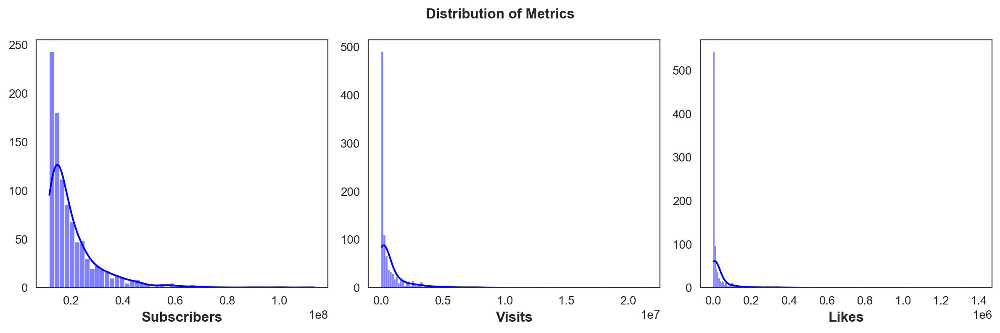

In [ ]:
get_histplot(df, ['Subscribers', 'Visits', 'Likes'])

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p>the histograms above align with our deductions from earlier, only with some of the outliers removed for less skewed results </p>
</div>

In [ ]:
category_counts = df['Categories'].value_counts()
category_counts

Categories
Music and Dance                      159
Movies, Animation                     61
Music and Dance, Movies               41
News and Politics                     36
Daily Vlogs                           36
Animation, Video Games                34
Movies, Comedy                        34
Animation, Toys                       29
Animation, Comedy                     26
Movies                                24
Education                             23
Animation                             22
Video Games                           19
Music and Dance, Animation            16
Video Games, Comedy                   16
Science and Technology                14
Food and Drink                        12
Comedy                                10
Toys                                  10
Movies, Toys                           9
Movies, Video Games                    8
Sports                                 8
Music and Dance, Comedy                6
Toys, Cars and Vehicles                4
DIY a

In [ ]:
#dropping the least prominent categories for plotting

least_32 = df['Categories'].value_counts().nsmallest(32)
category_counts.drop(least_32.index, inplace = True)
category_counts['Other'] = least_32.sum()

category_counts

Categories
Music and Dance            159
Movies, Animation           61
Music and Dance, Movies     41
News and Politics           36
Daily Vlogs                 36
Animation, Video Games      34
Movies, Comedy              34
Animation, Toys             29
Animation, Comedy           26
Movies                      24
Education                   23
Animation                   22
Video Games                 19
Other                      145
Name: count, dtype: int64

In [ ]:
category_counts.shape

(14,)

<div style = "font-size: 22px; font-family: 'Arial', 'Helvetica', 'sans-serif'; text-align: left; border-color: gray; border-width: 2px; border-radius: 12px; border-style: solid; padding: 10px;"><b>How are the categories distributed?</b></div>

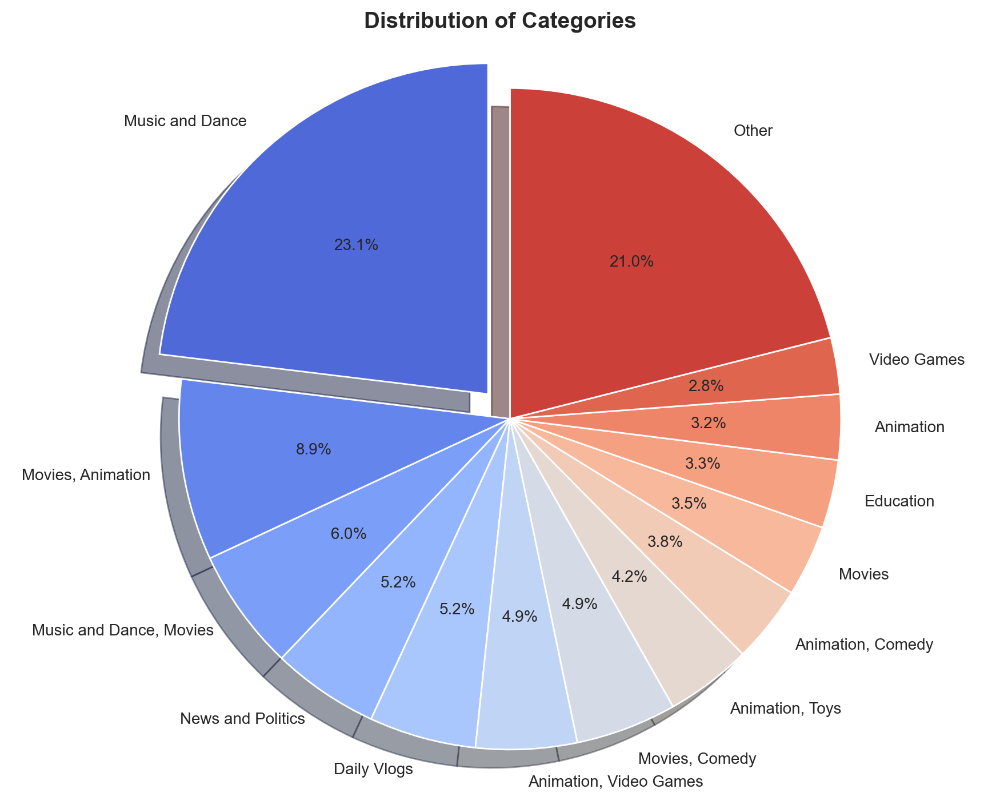

In [ ]:
plt.figure(figsize = (9, 7))

plt.pie(category_counts.values, labels=category_counts.index,
        autopct='%1.1f%%', shadow=True, startangle=90, explode = (0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0),
        colors=sns.color_palette('coolwarm', n_colors=len(category_counts)))

plt.title('Distribution of Categories')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p>We can see that among the top YouTubers, majority of them (<b>about 23%</b>) focus on <b>Music and Dance</b>, with the next most popular categories being <b>Movies and Animation</b>, <b>Music, Dance and Movies</b>, <b>News & Politics</b>, and <b>Daily Vlogs</b>, although significantly less than the most popular category at about <b>8.9%, 6%, 5.2%, and 5.2%</b> of the category proportions respectively</p>
</div>

<div style = "font-size: 22px; font-family: 'Arial', 'Helvetica', 'sans-serif'; text-align: left; border-color: gray; border-width: 2px; border-radius: 12px; border-style: solid; padding: 10px;"><b>Are there any <em>correlations</em> worth noting ? </b></div>

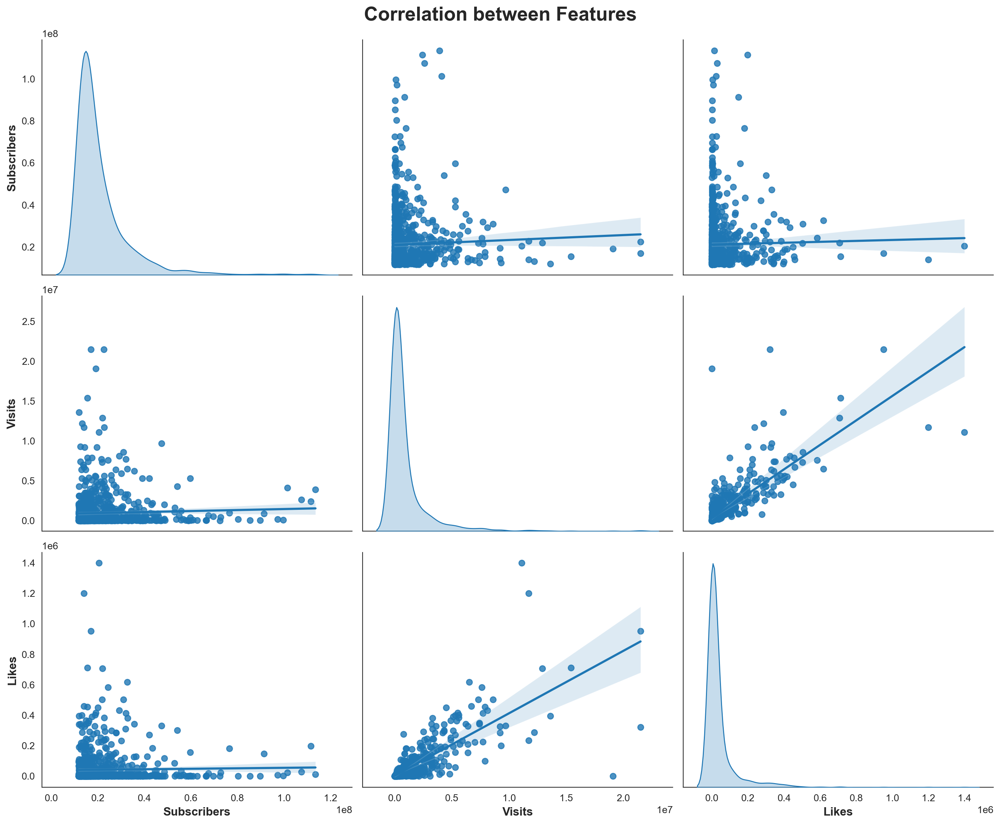

In [ ]:
sns.pairplot(data = df, kind = 'reg', diag_kind = 'kde', height = 4, aspect = 1.2)
plt.suptitle('Correlation between Features', fontweight = 'bold', fontsize = 20)
plt.tight_layout();

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p>Some interesting findings are revealed in the pairplot; There is a postive correlation between Number of visits and number of likes, as channels with more visits tend to receive more likes</p>
    <p>However, we see inverse relationships for different metrics; Likes and Subscribers appear to have a negative relationship as channels with more subscribers tend to have fewer likes as compared to those with fewer subscribers</p>
    <p>The same observation holds for Visits and number of Subscribers, as channels with more subscribers tend to have fewer visits</p>
</div>

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif; font-size: 16px;">
  <p><b>Does the trend above vary for different continents?</b></p>
</div>

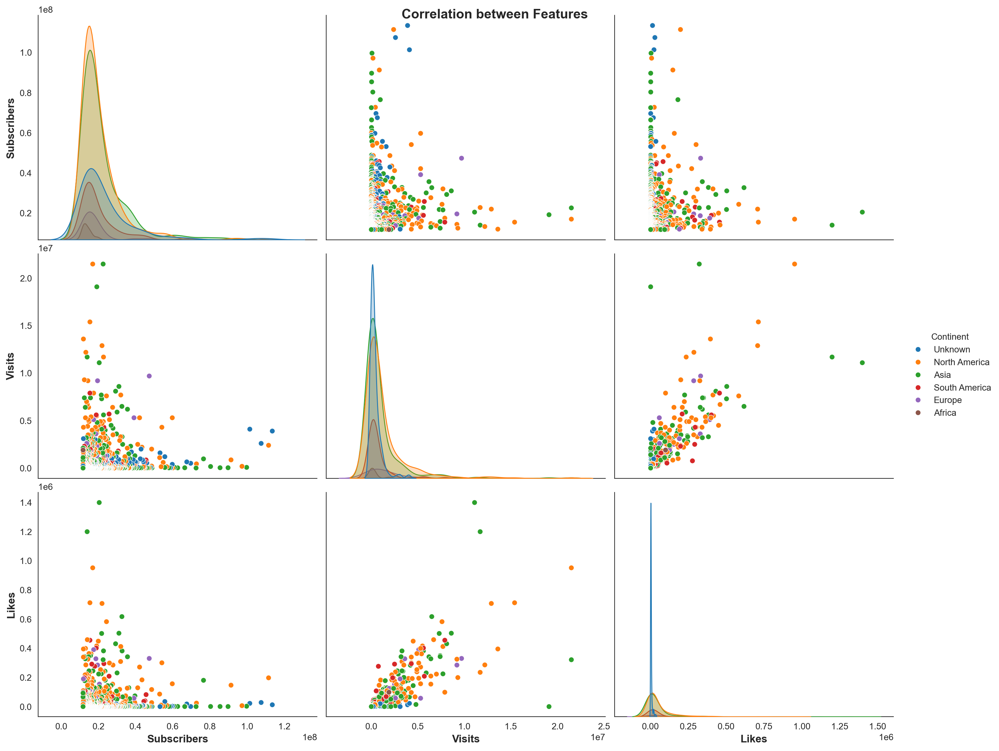

In [ ]:
sns.pairplot(df, hue = 'Continent', height = 4, aspect = 1.2)
plt.suptitle('Correlation between Features', fontweight = 'bold', fontsize = 15)
plt.show()

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p>It can also be seen from the pairplot above, that the individual continents don't seem to illustrate different distributions; all the continent appear to have roughly similar distributions as the ones we saw above, and the correlations remain roughly about the same</p>
</div>

In [ ]:
style_df(df.head())

,Username,Categories,Subscribers,Country,Visits,Likes,Continent
Rank,,,,,,,
5,KidsDianaShow,"Animation, Toys",113500000,Unknown,3900000.000000,12400,Unknown
6,PewDiePie,"Movies, Video Games",111500000,United States,2400000.000000,197300,North America
7,LikeNastyaofficial,Toys,107500000,Unknown,2600000.000000,28000,Unknown
8,VladandNiki,"Animation, Toys",101400000,Unknown,4100000.000000,22100,Unknown
9,zeemusiccompany,Music and Dance,99700000,India,74300.000000,2600,Asia


<div style = "font-size: 22px; font-family: 'Arial', 'Helvetica', 'sans-serif'; text-align: left; border-color: gray; border-width: 2px; border-radius: 12px; border-style: solid; padding: 10px;"><b>How are the Channels distributed across the Countries? </b></div>

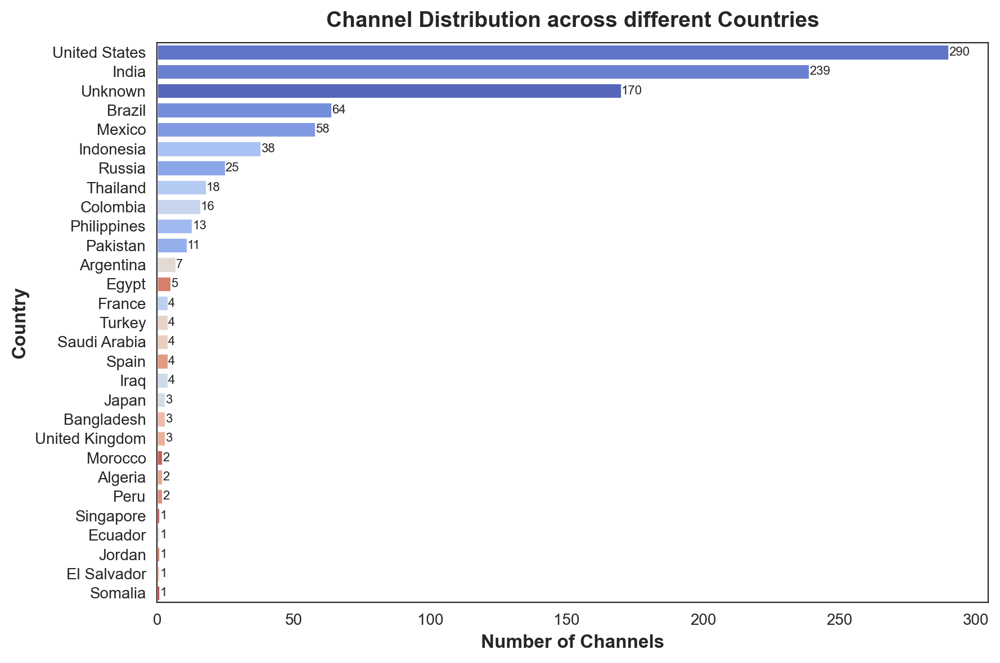

In [ ]:
plt.figure(figsize = (9, 6))
ax = sns.countplot(data = df, y = 'Country', palette = 'coolwarm', hue = 'Country', order = df['Country'].value_counts().index)

for p in ax.patches:
    width = p.get_width()
    ax.annotate(f'{width:.0f}', (width, p.get_y() + p.get_height() / 2), va='center', fontsize = 8)

ax.set_title('Channel Distribution across different Countries')
ax.set_xlabel('Number of Channels')
plt.show()

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p>We can see that the largest proportion of Channels in the top 1000 are from <b>the United States</b>, with about 290 channels, followed by <b>India</b> with 239, and those in Unknown countries totalling up 170</p>
    <p><b>Brazil, Mexico, Indonesia & Russia</b> are also very popular, and the least occuring countries are <b>Japan, Bangladesh, the United Kingdom, Morroco, Algeria, Peru</b> et cetera.</p>
</div>

<div style = "font-size: 22px; font-family: 'Arial', 'Helvetica', 'sans-serif'; text-align: left; border-color: gray; border-width: 2px; border-radius: 12px; border-style: solid; padding: 10px;"><b>How are the Channels distributed across the Continents? </b></div>

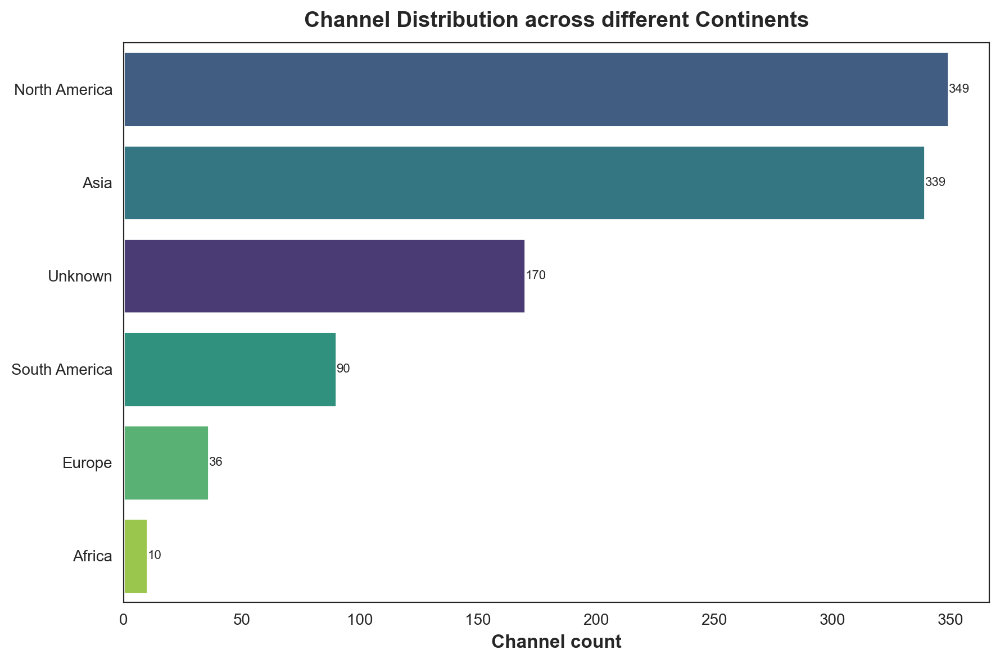

In [ ]:
plt.figure(figsize = (9, 6))
ax = sns.countplot(data = df, y = 'Continent', palette = 'viridis', hue = 'Continent', order = df['Continent'].value_counts().index)

for p in ax.patches:
    width = p.get_width()
    ax.annotate(f'{width:.0f}', (width, p.get_y() + p.get_height() / 2), va='center', fontsize = 8)

ax.set_title('Channel Distribution across different Continents')
ax.set_xlabel('Channel count')
ax.set_ylabel('')
plt.show()

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p><b>North America</b> has most of the channels, followed by <b>Asia & South America</b>, with the continent with the least number of popular channels being <b>Africa</b></p>
</div>

<div style = "font-size: 22px; font-family: 'Arial', 'Helvetica', 'sans-serif'; text-align: left; border-color: gray; border-width: 2px; border-radius: 12px; border-style: solid; padding: 10px;"><b>* How do Content preferences differ across Continents?</b></div>

In [ ]:
style_df(df.groupby('Continent')['Categories'].count().to_frame().T.reset_index())


Continent,index,Africa,Asia,Europe,North America,South America,Unknown
0,Categories,6,181,30,265,72,135


In [ ]:
from warnings import simplefilter
simplefilter('ignore')

def preferences_across_continents(df: pd.core.frame.DataFrame):
    df_c = df.copy()

    try:
        if 'Continent' in df_c.columns:
            continent_names = df_c['Continent'].unique()

            n = int(len(continent_names))
            fig, axes = plt.subplots(int(n / 2), 2, figsize=(3 * n, 3 * n))

            for continent, ax in zip(continent_names, axes.flat):
                target_data = df_c.loc[df_c['Continent'] == continent]
                category_counts = target_data['Categories'].value_counts()

                # Sieving out the smaller categories for a more structured plot

                k  = target_data['Categories'].nunique()
                if k > 10:
                    idx_to_drop = int(k / 5) * 3
                    least_cat = category_counts.nsmallest(idx_to_drop)
                    category_counts.drop(least_cat.index, inplace = True)
                    category_counts['Other'] = least_cat.sum()

                ax.pie(category_counts.values, labels=category_counts.index, autopct = '%1.1f%%', startangle = 90,
                        colors = sns.color_palette('coolwarm', len(category_counts)), shadow = True)
                ax.set_title('Genre Popularity in {}'.format(continent))

            return fig, axes
    except Exception as e:
        return e


(<Figure size 1800x1800 with 6 Axes>,
 array([[<Axes: title={'center': 'Genre Popularity in Unknown'}>,
         <Axes: title={'center': 'Genre Popularity in North America'}>],
        [<Axes: title={'center': 'Genre Popularity in Asia'}>,
         <Axes: title={'center': 'Genre Popularity in South America'}>],
        [<Axes: title={'center': 'Genre Popularity in Europe'}>,
         <Axes: title={'center': 'Genre Popularity in Africa'}>]],
       dtype=object))

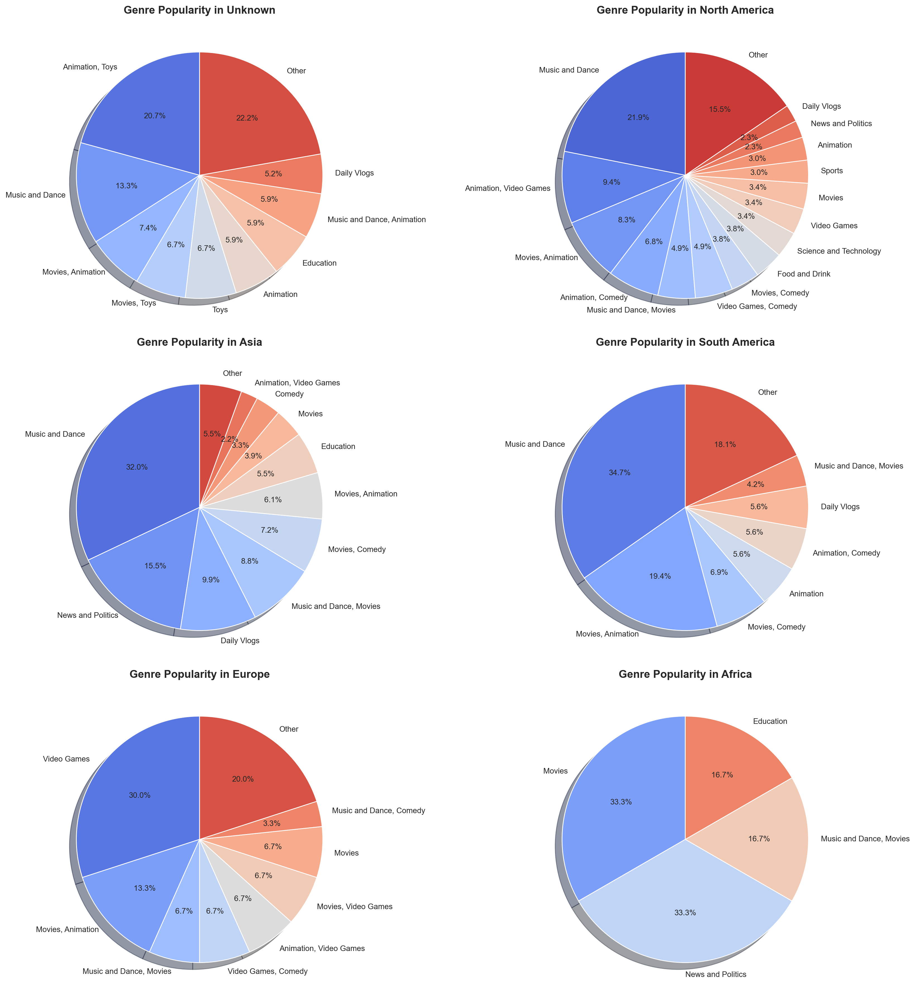

In [ ]:
preferences_across_continents(df)

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p>The Categories are different across each of the continents; </p>
    <p>The most popular categories in North America are <b>Music & Dance, Animation & Video Games</b>, and <b>Movies & Animation</b></p>
    <p>Preferences are a bit different in Asia, with Majority of channels engaged in <b>Music & Dance, News & Politics</b> and <b>Daily Vlogs</b></p>
    <p><b>Music & Dance</b>also takes majority place in South America, with <b>Movies, Animation & Comedy</b> coming in next popular</p>
    <p>In Europe, <b>Video Games, Movies & Animation, and Music & dance</b> hold the majority of popular channels, and in Africa, <b>Movies, News & Politics</b> hold the top spots, accounting for about 2/3 of the total categories</p>
    </p>
</div>

In [ ]:
style_df(df.head())

,Username,Categories,Subscribers,Country,Visits,Likes,Continent
Rank,,,,,,,
5,KidsDianaShow,"Animation, Toys",113500000,Unknown,3900000.000000,12400,Unknown
6,PewDiePie,"Movies, Video Games",111500000,United States,2400000.000000,197300,North America
7,LikeNastyaofficial,Toys,107500000,Unknown,2600000.000000,28000,Unknown
8,VladandNiki,"Animation, Toys",101400000,Unknown,4100000.000000,22100,Unknown
9,zeemusiccompany,Music and Dance,99700000,India,74300.000000,2600,Asia


<div style = "font-size: 22px; font-family: 'Arial', 'Helvetica', 'sans-serif'; text-align: left; border-color: gray; border-width: 2px; border-radius: 12px; border-style: solid; padding: 10px;"><b>* How do Likes, Visits and Subsribers vary on average across Continents?</b></div>

In [ ]:
country_agg = df.groupby('Country')[['Likes', 'Visits', 'Subscribers']].mean()
style_df(country_agg.head())

,Likes,Visits,Subscribers
Country,,,
Algeria,14400.000000,262050.000000,15750000.000000
Argentina,132979.000000,2067742.857143,17728571.428571
Bangladesh,349.333333,33566.666667,18400000.000000
Brazil,27020.828125,419068.750000,19482812.500000
Colombia,55939.312500,910425.000000,20962500.000000


In [ ]:
def plot_aggregates(df : pd.core.frame.DataFrame, main_col : str, annotate = False):
    if annotate:
        sns.set_style('whitegrid')
    else:
        sns.set_style('white')

    try:
        df_c = df.groupby(main_col)[['Likes', 'Visits', 'Subscribers']].mean()

        fig, axes = plt.subplots(1, 3, figsize = (int(4 * df_c.shape[1]), 6))

        for col, ax in zip(df_c.columns, axes.flat):
            sns.barplot(data = df_c, x = col, y = main_col, order = df_c.sort_values(by = col, ascending = False).index, ax = ax, palette = 'mako')
            ax.set_ylabel('')
            ax.set_xlabel('Average {}'.format(col))

            if annotate:
                for p in ax.patches:
                    width = p.get_width()
                    ax.annotate(f'{width:.2e}', (width, p.get_y() + p.get_height() / 2), va='center', fontsize = 8)

        plt.suptitle('Distributions from one {} to another'.format(main_col), fontweight = 'bold')
        plt.tight_layout()

        return fig, axes
    except Exception as e:
        return e


(<Figure size 1200x600 with 3 Axes>,
 array([<Axes: xlabel='Average Likes'>, <Axes: xlabel='Average Visits'>,
        <Axes: xlabel='Average Subscribers'>], dtype=object))

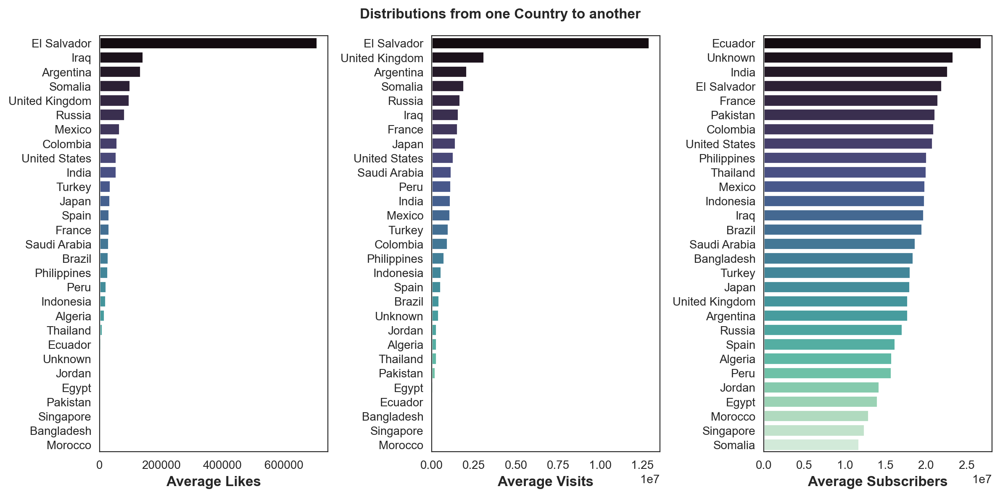

In [ ]:
plot_aggregates(df, 'Country')

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p>We can also see how the metrics vary from one country to another;</p>
    <p>El Salvador, Iraq, Argentina, Somalia and the UK have the most likes on average</p>
    <p>For the most visits by average, El Salvador tops again, followed by the UK, Argentina, Somalia and Russia </p>
    <p>The number of subscribers also appears to be more evenly distributed, but Ecuador, India, El Salvador, France and Pakistan are among the top Subscribed channels on average</p>
</div>

(<Figure size 1200x600 with 3 Axes>,
 array([<Axes: xlabel='Average Likes'>, <Axes: xlabel='Average Visits'>,
        <Axes: xlabel='Average Subscribers'>], dtype=object))

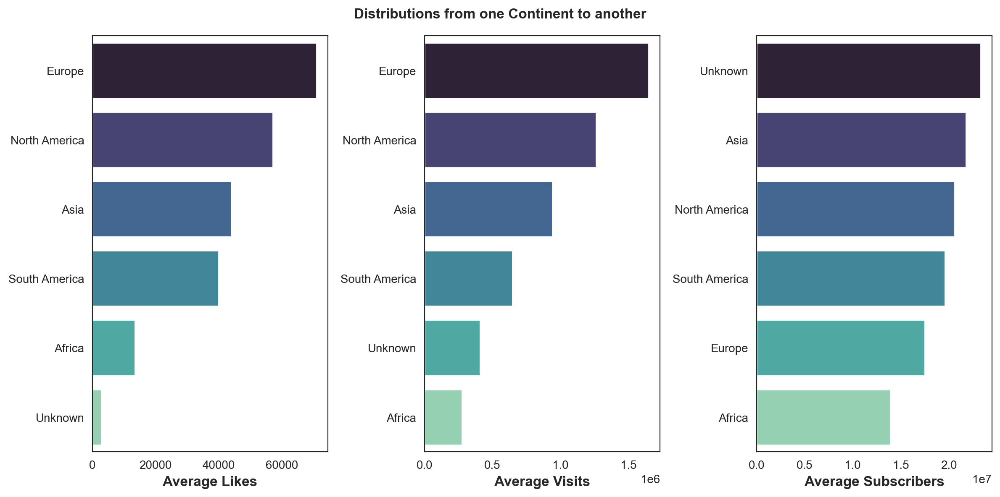

In [ ]:
plot_aggregates(df, 'Continent')

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p>From the distributions across continents, channels coming from <b>Europe, North America & Asia</b> have the highest average likes and visits, and the highest most subscriptions on average are <b>Asia, North America & South America</b> with majority of channels being in the Unknown category</p>
</div>

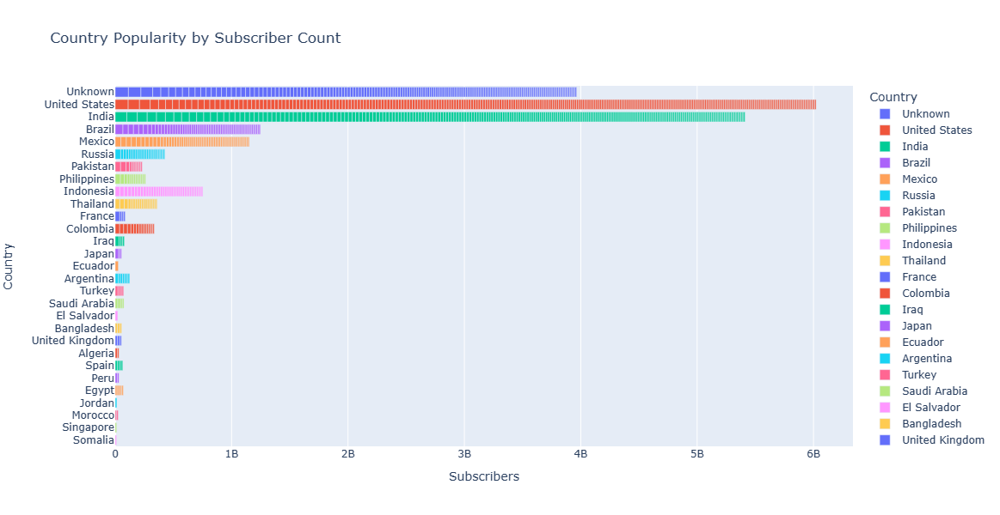

In [ ]:
# Import plotly express module
import plotly.express as px

fig = px.bar(df, y='Country', x='Subscribers', color='Country', color_continuous_scale='Coolwarm',
             labels = True, title = 'Country Popularity by Subscriber Count')

fig.update_layout(width=800, height=600)

fig.show()


<div style = "font-size: 20px; font-family: 'Helvetica', 'Arial', 'sans-serif'; text-align: left; border-width: 2px; border-style: solid; border-color: gray; border-radius: 10px; padding: 10px;"><b>* Who are the top performing YouTube Channels?</b></div>

In [ ]:
# Finding the outliers (highest performing channels) in the numerical columns
def get_top_performers(df : pd.core.frame.DataFrame):
    try:
        df_copy = df.copy()
        for col in df_copy.select_dtypes(include = ['number']):
            Q1 = df_copy[col].quantile(0.25)
            Q3 = df_copy[col].quantile(0.75)
            IQR = Q3 - Q1
            tp = df_copy.loc[(df_copy[col] > (Q3 + 1.5 * IQR))]
            return tp
    except Exception as e:
        return e


In [ ]:
df_top = get_top_performers(df_)
style_df(df_top.head())

,Username,Categories,Subscribers,Country,Visits,Likes
Rank,,,,,,
1,tseries,Música y baile,249500000,India,86200.000000,2700
2,MrBeast,"Videojuegos, Humor",183500000,Estados Unidos,117400000.000000,5300000
3,CoComelon,Educación,165500000,Unknown,7000000.000000,24700
4,SETIndia,nan,162600000,India,15600.000000,166
5,KidsDianaShow,"Animación, Juguetes",113500000,Unknown,3900000.000000,12400


In [ ]:
category_translation_dict = {
    'Animación, Juguetes': 'Animation, Toys',
    'Películas, Videojuegos': 'Movies, Video Games',
    'Juguetes': 'Toys',
    'Música y baile': 'Music and Dance',
    'Videojuegos': 'Video Games',
    'Películas, Animación': 'Movies, Animation',
    'Películas': 'Movies',
    'Noticias y Política': 'News and Politics',
    'Educación': 'Education',
    'Animación, Humor': 'Animation, Comedy',
    'Música y baile, Animación': 'Music and Dance, Animation',
    'Música y baile, Películas': 'Music and Dance, Movies',
    'Películas, Juguetes': 'Movies, Toys',
    'Películas, Humor': 'Movies, Comedy',
    'Vlogs diarios': 'Daily Vlogs',
    'Videojuegos, Juguetes': 'Video Games, Toys',
    'Animación, Videojuegos': 'Animation, Video Games',
    'Animación': 'Animation',
    'Música y baile, Humor': 'Music and Dance, Comedy',
    'Videojuegos, Humor': 'Video Games, Comedy',
    'Diseño/arte, DIY y Life Hacks': 'Design/Art, DIY and Life Hacks',
    'Ciencia y tecnología': 'Science and Technology',
    'Fitness, Salud y autoayuda': 'Fitness, Health, and Self-Help',
    'Belleza, Moda': 'Beauty, Fashion',
    'Humor': 'Comedy',
    'Comida y bebida': 'Food and Drink',
    'Deportes': 'Sports',
    'Fitness': 'Fitness',
    'Viajes, Espectáculos': 'Travel, Shows',
    'Comida y bebida, Salud y autoayuda': 'Food and Drink, Health and Self-Help',
    'Diseño/arte': 'Design/Art',
    'DIY y Life Hacks, Juguetes': 'DIY and Life Hacks, Toys',
    'Educación, Juguetes': 'Education, Toys',
    'Juguetes, Coches y vehículos': 'Toys, Cars and Vehicles',
    'Música y baile, Juguetes': 'Music and Dance, Toys',
    'Animales y mascotas': 'Animals and Pets',
    'ASMR': 'ASMR',
    'Moda': 'Fashion',
    'DIY y Life Hacks': 'DIY and Life Hacks',
    'Diseño/arte, Belleza': 'Design/Art, Beauty',
    'Coches y vehículos': 'Cars and Vehicles',
    'Animación, Humor, Juguetes': 'Animation, Comedy, Toys',
    'ASMR, Comida y bebida': 'ASMR, Food and Drink',
    'Comida y bebida, Juguetes': 'Food and Drink, Toys',
    'Juguetes, DIY y Life Hacks': 'Toys, DIY and Life Hacks',
    'Food and Drink, Salud y autoayuda': 'Food and Drink, Health and Self-help',
    'Design/Art, Belleza': 'Design/Art, Beauty'
}


df_top['Categories'] = df_top['Categories'].replace(category_translation_dict, regex=True)

In [ ]:
country_translation_dict = {
    'Unknown': 'Unknown',
    'Estados Unidos': 'United States',
    'India': 'India',
    'Brasil': 'Brazil',
    'México': 'Mexico',
    'Rusia': 'Russia',
    'Pakistán': 'Pakistan',
    'Filipinas': 'Philippines',
    'Indonesia': 'Indonesia',
    'Tailandia': 'Thailand',
    'Francia': 'France',
    'Colombia': 'Colombia',
    'Iraq': 'Iraq',
    'Japón': 'Japan',
    'Ecuador': 'Ecuador',
    'Argentina': 'Argentina',
    'Turquía': 'Turkey',
    'Arabia Saudita': 'Saudi Arabia',
    'El Salvador': 'El Salvador',
    'Bangladesh': 'Bangladesh',
    'Reino Unido': 'United Kingdom',
    'Argelia': 'Algeria',
    'España': 'Spain',
    'Perú': 'Peru',
    'Egipto': 'Egypt',
    'Jordania': 'Jordan',
    'Marruecos': 'Morocco',
    'Singapur': 'Singapore',
    'Somalia': 'Somalia'
}


df_top['Country'] = df_top['Country'].replace(country_translation_dict, regex = True)

In [ ]:
df_top['Continent'] = df_top['Country'].apply(country_to_continent)

df_top['Continent'].unique()

array(['Asia', 'North America', 'Unknown', 'South America', 'Europe'],
      dtype=object)

<div style = "font-size: 22px; font-family: 'Arial', 'Helvetica', 'sans-serif'; text-align: left; border-color: gray; border-width: 2px; border-radius: 12px; border-style: solid; padding: 10px;"><b>What are the countries and Categories among the top YouTubers?</b></div>

In [ ]:
for col in ['Categories', 'Country']:
    print(f'\033[1;34m{col}\033[0m : \n{", ".join(map(str, df_top[col].unique()))} \n\n')


Categories : 
Music and Dance, Video Games, Comedy, Education, nan, Animation, Toys, Movies, Video Games, Toys, Video Games, Movies, Animation, Movies, News and Politics, Animation, Comedy, Music and Dance, Animation, Music and Dance, Movies, Movies, Toys, Movies, Comedy, Daily Vlogs 


Country : 
India, United States, Unknown, Brazil, Mexico, Russia, Pakistan, Philippines, Indonesia, Thailand, France 




(<Figure size 1200x600 with 3 Axes>,
 array([<Axes: xlabel='Average Likes'>, <Axes: xlabel='Average Visits'>,
        <Axes: xlabel='Average Subscribers'>], dtype=object))

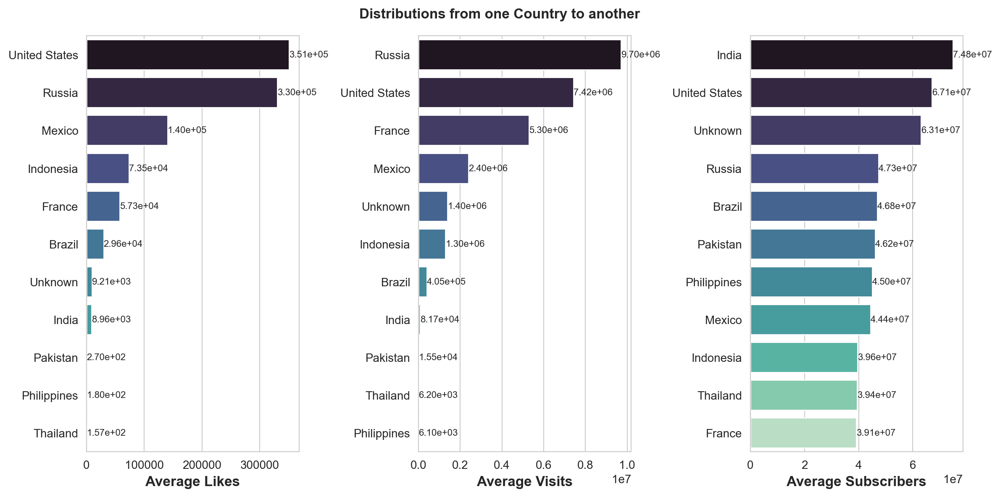

In [ ]:
plot_aggregates(df_top, 'Country', annotate = True)

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p>We can see from here how the countries are distributed among the top Youtube channels with respect to the defining metrics;</p>
    <p><b>United States and Russia</b> top in terms of Likes and Visits with over 350,000 likes on average and 9.7 million visits on average</p>
    <p><b>India, the US & Russia</b> top in terms of average subscribers, with <b>74.8 million, 67.1 million and 47.3 million </b> subscribers on average. However the subscriber count is more evenly distributed for subscribers and so the differences are less marginal as compared to Likes and Visits</p>
</div>

(<Figure size 1200x600 with 3 Axes>,
 array([<Axes: xlabel='Average Likes'>, <Axes: xlabel='Average Visits'>,
        <Axes: xlabel='Average Subscribers'>], dtype=object))

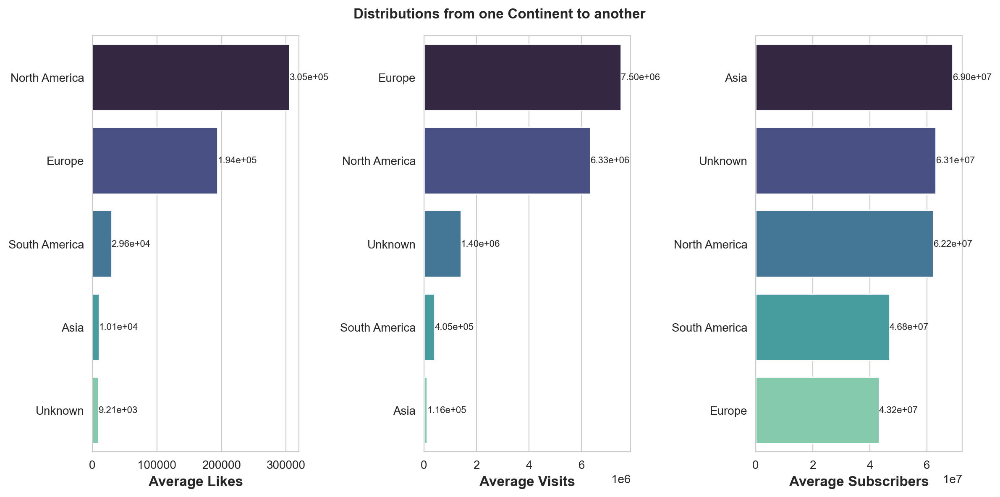

In [ ]:
plot_aggregates(df_top, 'Continent', annotate = True)

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p>In terms of the continents, <b>North America & Europe</b> top in terms of likes per video, per channel</p>
    <p>Europe and North America also top as well in terms of average visits, and Asia and North America topping for Average subscribers</p>
    <p>However we can see once again that the differences for the Subscribers are a lot less marginal as compared to average Visits and Likes</p>
</div>

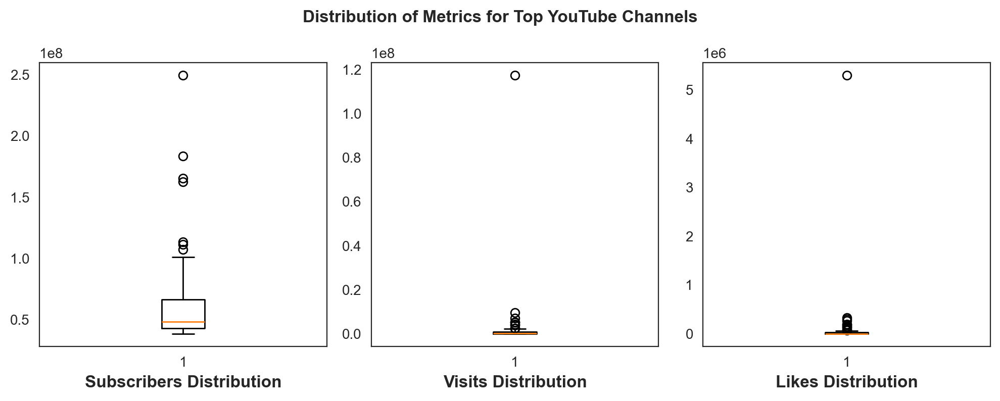

In [ ]:
sns.set_style('white')
fig, axes = plt.subplots(1, 3, figsize = (10, 4))
for col, ax in zip(df_top.select_dtypes(include = ['number']).columns, axes.flat):
    ax.boxplot(df_top[col])
    ax.set_xlabel('{} Distribution'.format(col))
plt.suptitle('Distribution of Metrics for Top YouTube Channels', fontweight = 'bold');


<div style = "font-size: 20px; font-family: 'Helvetica', 'Arial', 'sans-mono'; color: brown; text-align: left; border-color: gray; border-width: 5px; border-radius: 10px; border-style: solid; padding: 12px;"><b>*Who are the topmost performing YouTubers?</b></div>

In [ ]:
#filtering out the topmost YouTubers

tp = df_top.loc[
    (df_top['Subscribers'] > 1.5e6) |
    (df_top['Visits'] > 0.2e8) |
    (df_top['Likes'] > 1e6)
]
style_df(tp.head(20))

,Username,Categories,Subscribers,Country,Visits,Likes,Continent
Rank,,,,,,,
1,tseries,Music and Dance,249500000,India,86200.000000,2700,Asia
2,MrBeast,"Video Games, Comedy",183500000,United States,117400000.000000,5300000,North America
3,CoComelon,Education,165500000,Unknown,7000000.000000,24700,Unknown
4,SETIndia,nan,162600000,India,15600.000000,166,Asia
5,KidsDianaShow,"Animation, Toys",113500000,Unknown,3900000.000000,12400,Unknown
6,PewDiePie,"Movies, Video Games",111500000,United States,2400000.000000,197300,North America
7,LikeNastyaofficial,Toys,107500000,Unknown,2600000.000000,28000,Unknown
8,VladandNiki,"Animation, Toys",101400000,Unknown,4100000.000000,22100,Unknown
9,zeemusiccompany,Music and Dance,99700000,India,74300.000000,2600,Asia


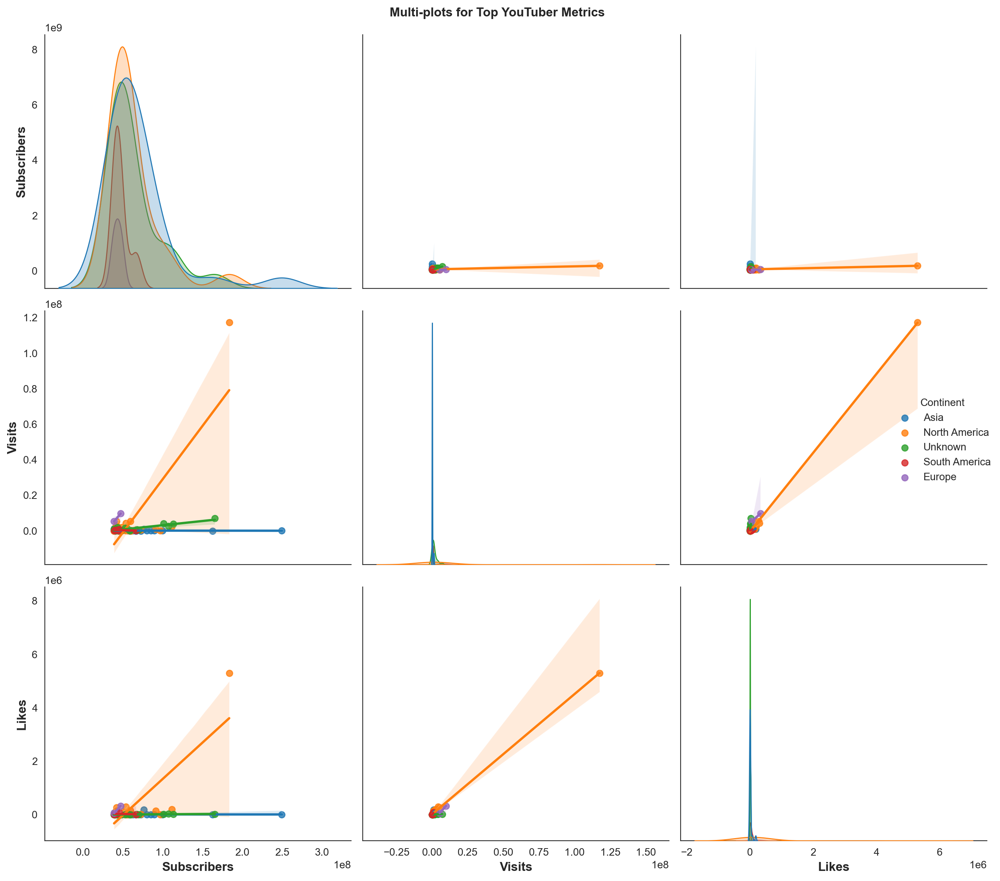

In [ ]:
sns.pairplot(tp, hue = 'Continent', height = 4, kind = 'reg')

plt.suptitle('Multi-plots for Top YouTuber Metrics', fontweight = 'bold')
plt.tight_layout()

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p>The trends among the top YouTube Channels aren't very different from the other YouTube Channels: We see a positive correlation between <b>Visits </b> and <b>Likes</b> (The more the visits, the more the likes), <b>Subscribers</b> and <b>Likes</b> (the more the subscribers, the higher the likes), and <b>Subscribers</b> and <b>Visits</b> (More subscribers means they'll have more visits)</p>
</div>

In [ ]:
style_df(tp.head(10))

,Username,Categories,Subscribers,Country,Visits,Likes,Continent
Rank,,,,,,,
1,tseries,Music and Dance,249500000,India,86200.000000,2700,Asia
2,MrBeast,"Video Games, Comedy",183500000,United States,117400000.000000,5300000,North America
3,CoComelon,Education,165500000,Unknown,7000000.000000,24700,Unknown
4,SETIndia,nan,162600000,India,15600.000000,166,Asia
5,KidsDianaShow,"Animation, Toys",113500000,Unknown,3900000.000000,12400,Unknown
6,PewDiePie,"Movies, Video Games",111500000,United States,2400000.000000,197300,North America
7,LikeNastyaofficial,Toys,107500000,Unknown,2600000.000000,28000,Unknown
8,VladandNiki,"Animation, Toys",101400000,Unknown,4100000.000000,22100,Unknown
9,zeemusiccompany,Music and Dance,99700000,India,74300.000000,2600,Asia


## <div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif; font-size: 15px;"><p><h2><b>Understanding The Different Segments among the Top YouTube Channels </b></h2></p><p>with Clustering Analysis<code>(KMeans)</code></p></div>

In [ ]:
df_.dtypes

Username        object
Categories      object
Subscribers      int64
Country         object
Visits         float64
Likes            int64
dtype: object

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, LabelEncoder

def make_clusters(df: pd.core.frame.DataFrame, standardized = False, encoded = False, n_clusters = 5):
    df_c = df.copy()
    kmeans = KMeans(n_clusters = n_clusters, random_state = 42)
    scaler = StandardScaler()


    categorical_cols = df_c.select_dtypes(include = ['object']).columns
#    numerical_cols = df_c.select_dtypes(include = ['number']).columns


    if not encoded:
        for col in categorical_cols:
            label_encoder = LabelEncoder()
            df_c[col] = label_encoder.fit_transform(df_c[col])

    if not standardized:
        df_c = scaler.fit_transform(df_c)

    df['Cluster'] = kmeans.fit_predict(df_c).astype(int)
    df['Cluster'] +=1  # To use labels starting from 1 instead of 0


    return df

def plot_clusters(df: pd.core.frame.DataFrame):
    df_c = df.copy()

    sns.pairplot(df_c, hue = 'Cluster', height = 5, aspect = 1. , palette = 'tab20')
    plt.suptitle('Multi-plot for Metrics (Based on Clusters)', fontweight = 'bold')




In [ ]:
df_cluster = make_clusters(df)
style_df(df_cluster.head(10))

,Username,Categories,Subscribers,Country,Visits,Likes,Continent,Cluster
Rank,,,,,,,,
5,KidsDianaShow,"Animation, Toys",113500000,Unknown,3900000.000000,12400,Unknown,3
6,PewDiePie,"Movies, Video Games",111500000,United States,2400000.000000,197300,North America,3
7,LikeNastyaofficial,Toys,107500000,Unknown,2600000.000000,28000,Unknown,3
8,VladandNiki,"Animation, Toys",101400000,Unknown,4100000.000000,22100,Unknown,3
9,zeemusiccompany,Music and Dance,99700000,India,74300.000000,2600,Asia,3
10,WWE,Video Games,97200000,United States,184500.000000,6300,North America,3
11,BLACKPINK,Music and Dance,91300000,United States,863200.000000,146900,North America,3
12,GoldminesTelefilms,nan,89700000,India,34600.000000,421,Asia,3
13,SonySAB,"Movies, Animation",85400000,India,35500.000000,615,Asia,3


In [ ]:
df_cluster.Cluster.unique()

array([3, 2, 4, 5, 1])

In [ ]:
df_cluster.to_csv(r"C:\Users\David Yeboah\Documents\yt_cluster_data.csv", index = False)
#since the cluster numbers change every time the function is run, we will use this instance to get consistency

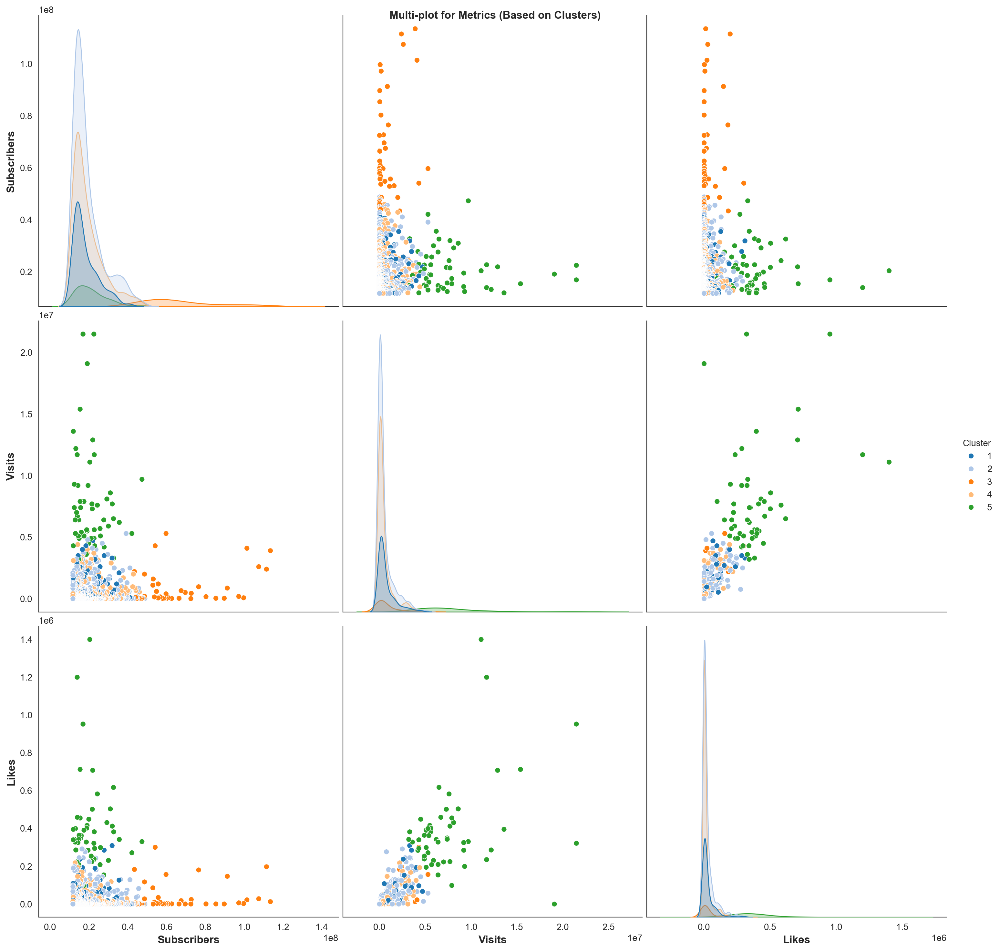

In [ ]:
plot_clusters(df_cluster);

<div style="background-color: #f5f5f5; border-color: #d3d3d3; border-width: 4px; border-style: solid; border-radius: 10px; padding: 15px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <h3 style="color: #333; margin-bottom: 10px;"><b>Unveiling the Essence: A Detailed Exploration of Channel Categories</b></h3>
  
  <h5 style="color: #007bff;"><b>Category 1: Rising Stars</b></h5>
  <p>In this category, channels emerge with fewer visits, likes, and subscribers, steadily climbing the ranks of Top YouTubers. They embody the aspiring talents, on the verge of breaking into the mainstream.</p>
  
  <h5 style="color: #87ceeb;"><b>Category 2: Ground Zero</b></h5>
  <p>This category represents the YouTubers on the lowest end of the spectrum. Among the top YouTubers, they fall behind the most in all the respective metrics, and are also very populous.</p>
  
  <h5 style="color: #ff8c00;"><b>Category 3: Subscribers' Haven</b></h5>
  <p>This category hosts channels with a substantial subscriber base but modest likes and visits. Recognized for their high retention rates, they craft popular content, albeit at a less frequent pace, resulting in a distinct engagement pattern.</p>
  
  <h5 style="color: rgba(255, 218, 190, 1);"><b>Category 4: Balancing Act</b></h5>
  <p>Moderate in visits, likes, and subscribers, these channels strike a balance on the lower spectrum, outshining <b style="color: #87ceeb;">Category 2</b> in overall metrics. They hold a middle ground, contributing to the diverse YouTube landscape.</p>
  
  <h5 style="color: #008000;"><b>Category 5: Engaging Echoes</b></h5>
  
  <p style = "color:default;">Channels in this category boast the highest likes and visits, yet maintain a humble subscriber count. They epitomize high engagement but wrestle with retention rates, creating a vibrant but fleeting viewership.</p>
</div>


<div style = "font-size: 22px; font-family: 'Arial', 'Helvetica', 'sans-serif'; text-align: left; border-color: gray; border-width: 2px; border-radius: 12px; border-style: solid; padding: 10px;"><b>Do some categories outperform others in metrics for different continents?</b></div>

In [ ]:
style_df(df.head())

,Username,Categories,Subscribers,Country,Visits,Likes,Continent,Cluster
Rank,,,,,,,,
5,KidsDianaShow,"Animation, Toys",113500000,Unknown,3900000.000000,12400,Unknown,4
6,PewDiePie,"Movies, Video Games",111500000,United States,2400000.000000,197300,North America,4
7,LikeNastyaofficial,Toys,107500000,Unknown,2600000.000000,28000,Unknown,4
8,VladandNiki,"Animation, Toys",101400000,Unknown,4100000.000000,22100,Unknown,4
9,zeemusiccompany,Music and Dance,99700000,India,74300.000000,2600,Asia,4


In [ ]:
df.Categories.value_counts().nlargest(5).index

Index(['Music and Dance', 'Movies, Animation', 'Music and Dance, Movies',
       'News and Politics', 'Daily Vlogs'],
      dtype='object', name='Categories')

In [ ]:
def top_category_metrics(df: pd.core.frame.DataFrame):
    try:
        if all(col in df.columns for col in ['Categories', 'Continent', 'Subscribers', 'Visits', 'Likes']):
            df_c = df.copy()
            continents = df.Continent.unique()

            #get the top 10 performing categories in each continent
            for continent in continents:
                if continent == 'Unknown':
                    continue

                continent_data = df_c.loc[df.Continent == continent]
                top_categories = continent_data['Categories'].value_counts().nlargest(10).index

                #create df for illustration
                cont_cat_metrics = df_c.groupby('Categories')[['Subscribers', 'Visits', 'Likes']].mean().reset_index()

                cont_cat_metrics = cont_cat_metrics.loc[cont_cat_metrics.Categories.isin(top_categories)]

                fig, axes = plt.subplots(1, 3, figsize = (15, 10))

                for metric, ax in zip(['Subscribers', 'Visits', 'Likes'], axes.flat):
                    sns.barplot(data = cont_cat_metrics, x = metric, y = 'Categories', palette = 'cividis', ax = ax,
                                order = cont_cat_metrics.sort_values(by = metric, ascending = False)['Categories'])
                    ax.set_ylabel('')
                    plt.suptitle('Metric Performances Across Top Categories in {}'.format(continent), fontweight = 'bold')

        else:
            raise ValueError("'Categories', 'Continent', 'Subscribers', 'Visits' and 'Likes' columns required in DataFrame.")

    except Exception as e:
        return e

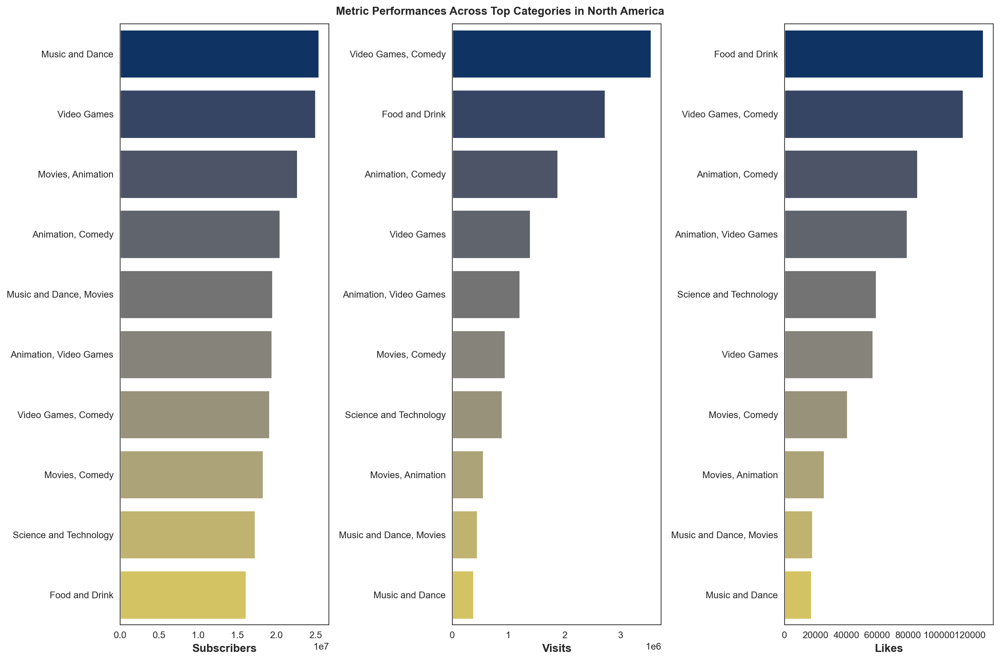

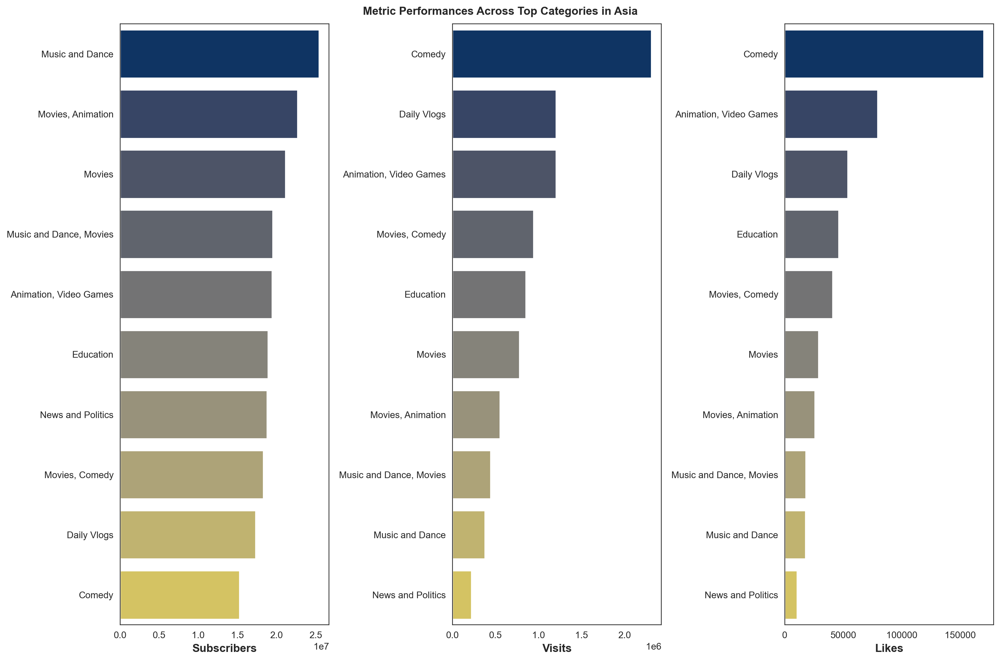

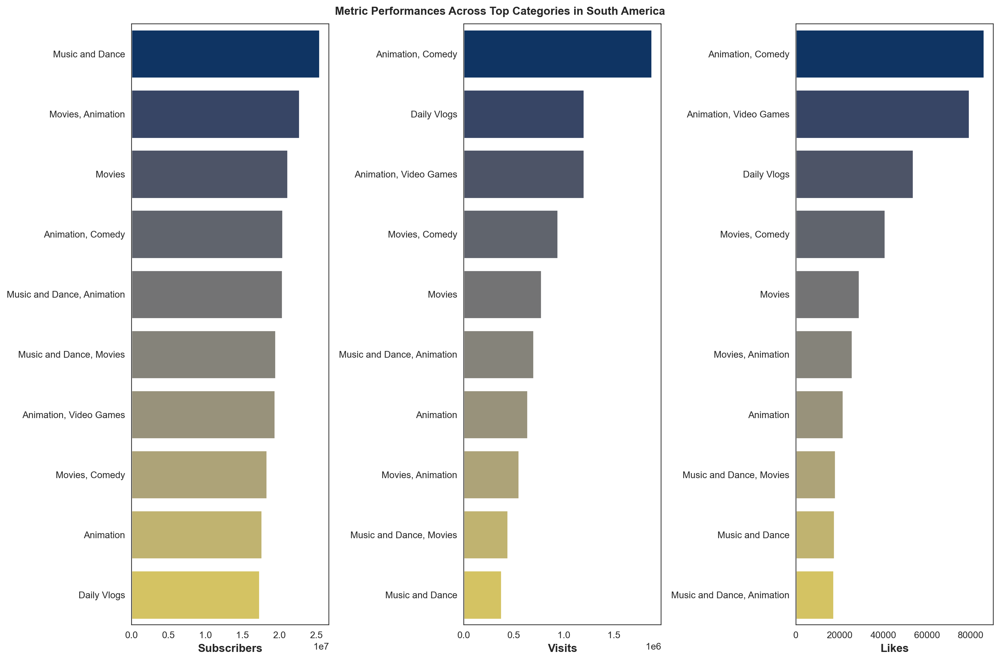

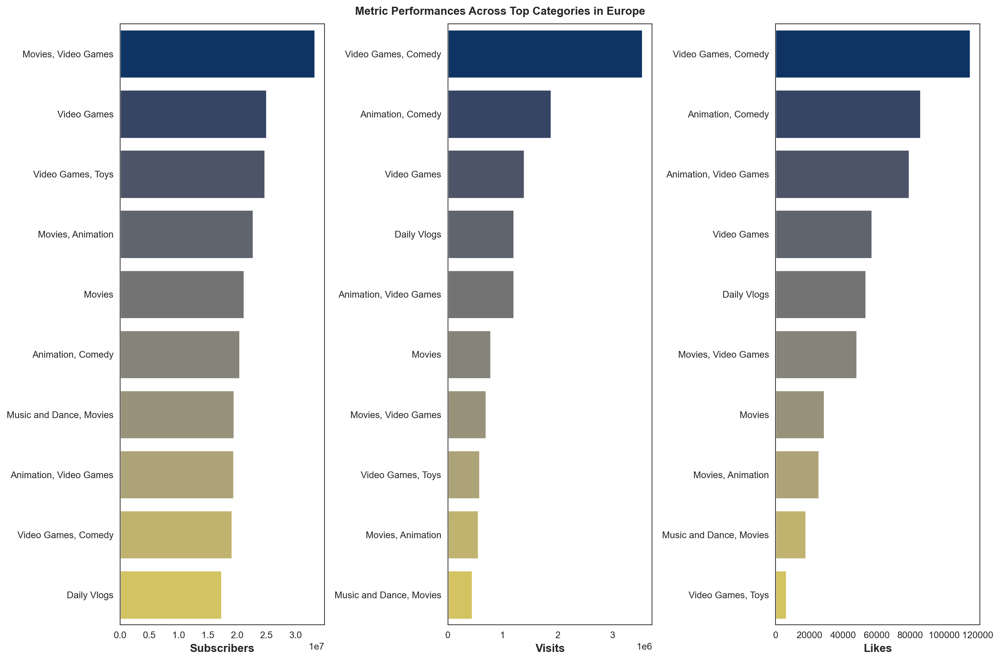

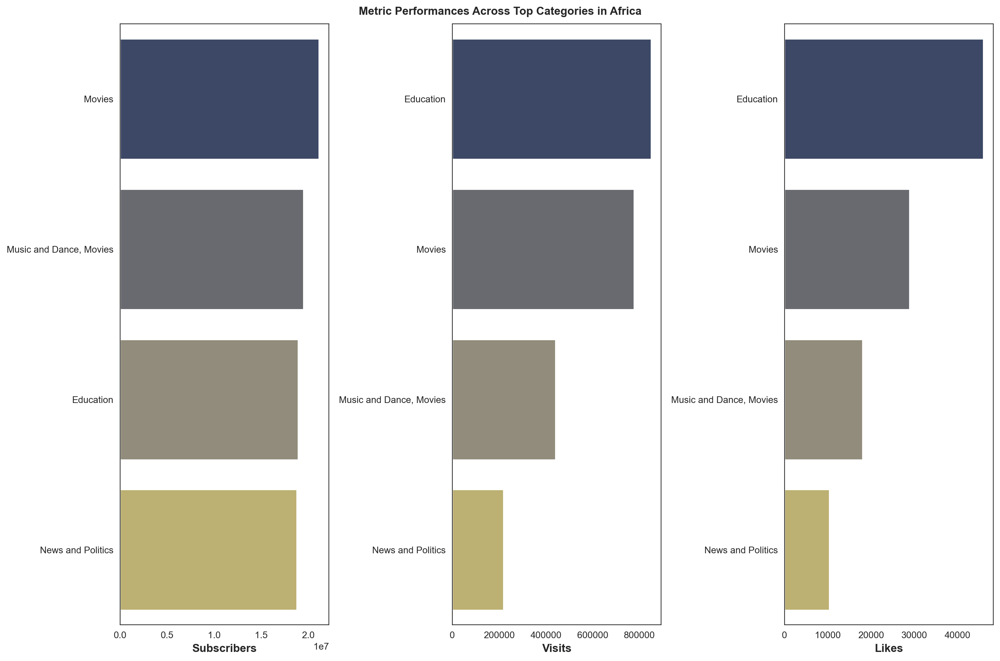

In [ ]:
top_category_metrics(df)

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
  <p>The categories reveal themselves in the areas they shine in the most, based on their continents as can be seen above</p>
</div>

In [ ]:
df_cluster.loc[df_cluster.Cluster == 1].head()

,Username,Categories,Subscribers,Country,Visits,Likes,Continent,Cluster
Rank,,,,,,,,
66,LittleBabyBum,"Animation, Toys",41000000,Unknown,99000.0,184,Unknown,1
67,shfa2,"Animation, Toys",40600000,Unknown,585500.0,4800,Unknown,1
101,markiplier,"Animation, Video Games",35500000,United States,2100000.0,126500,North America,1
109,jbalvin,"Animation, Video Games",34200000,Colombia,16900.0,1600,South America,1
110,SSSniperWolf,"Animation, Comedy",34200000,United States,1200000.0,34600,North America,1


In [ ]:
df_cluster.loc[df_cluster.Cluster == 2].head()

,Username,Categories,Subscribers,Country,Visits,Likes,Continent,Cluster
Rank,,,,,,,,
39,shemaroo,NaN,48800000,India,22600.0,163,Asia,2
43,sonymusicindiaVEVO,Music and Dance,47500000,India,36600.0,664,Asia,2
49,felipeneto,NaN,45600000,Brazil,850600.0,82100,South America,2
50,abscbnentertainment,NaN,45000000,Philippines,6100.0,180,Asia,2
51,vcsabiavideos,NaN,45000000,Brazil,665700.0,39800,South America,2


In [ ]:
df_cluster.loc[df_cluster.Cluster == 3].head()

,Username,Categories,Subscribers,Country,Visits,Likes,Continent,Cluster
Rank,,,,,,,,
44,A4a4a4a4,"Animation, Comedy",47300000,Russia,9700000.0,330400,Europe,3
63,KimberlyLoaiza,Music and Dance,42100000,Mexico,5300000.0,271300,North America,3
99,TechnoGamerzOfficial,NaN,35600000,India,6200000.0,341800,Asia,3
123,AboFlah,"Animation, Video Games",32700000,Iraq,3300000.0,382000,Asia,3
124,MRINDIANHACKER,NaN,32600000,India,6500000.0,617400,Asia,3


In [ ]:
df_cluster.loc[df_cluster.Cluster == 4].head()

,Username,Categories,Subscribers,Country,Visits,Likes,Continent,Cluster
Rank,,,,,,,,
5,KidsDianaShow,"Animation, Toys",113500000,Unknown,3900000.0,12400,Unknown,4
6,PewDiePie,"Movies, Video Games",111500000,United States,2400000.0,197300,North America,4
7,LikeNastyaofficial,Toys,107500000,Unknown,2600000.0,28000,Unknown,4
8,VladandNiki,"Animation, Toys",101400000,Unknown,4100000.0,22100,Unknown,4
9,zeemusiccompany,Music and Dance,99700000,India,74300.0,2600,Asia,4


In [ ]:
df_cluster.loc[df_cluster.Cluster == 5].head()

,Username,Categories,Subscribers,Country,Visits,Likes,Continent,Cluster
Rank,,,,,,,,
42,getmovies,NaN,48100000,Unknown,55700.0,329,Unknown,5
47,vootkids,NaN,46000000,Unknown,540900.0,3400,Unknown,5
53,KatyPerry,Music and Dance,44400000,Unknown,101400.0,7500,Unknown,5
54,Shakira,Video Games,44400000,United States,102100.0,8200,North America,5
56,MashaBearRUSSIAN,NaN,44200000,Unknown,664500.0,5700,Unknown,5


<div style = "font-size: 22px; font-family: 'Arial', 'Helvetica', 'sans-serif'; color: brown;text-align: left; border-color: gray; border-width: 2px; border-radius: 12px; border-style: solid; padding: 10px;"><b>Making Predictions for a New YouTuber!</b></div>

In [ ]:
yt_data = pd.read_csv(r"C:\Users\David Yeboah\Documents\yt_cluster_data.csv") #Importing the data so the clusters don't re-run
style_df(yt_data.head())

,Username,Categories,Subscribers,Country,Visits,Likes,Continent,Cluster
0,KidsDianaShow,"Animation, Toys",113500000,Unknown,3900000.000000,12400,Unknown,3
1,PewDiePie,"Movies, Video Games",111500000,United States,2400000.000000,197300,North America,3
2,LikeNastyaofficial,Toys,107500000,Unknown,2600000.000000,28000,Unknown,3
3,VladandNiki,"Animation, Toys",101400000,Unknown,4100000.000000,22100,Unknown,3
4,zeemusiccompany,Music and Dance,99700000,India,74300.000000,2600,Asia,3


In [ ]:
def score_model(data, model, model_params, scaled=False, encoded=False):
    """
    Trains and evaluates a machine learning model using the provided data.

    Parameters:
    - data (pd.DataFrame): The DataFrame containing the input features and target variable.
    - model (estimator): The machine learning model to be trained and evaluated.
    - model_params (dict): The hyperparameter grid for model tuning using GridSearchCV.
    - scaled (bool): If True, scales numeric features using StandardScaler (default is False).
    - encoded (bool): If True, encodes categorical features using LabelEncoder (default is False).

    Returns:
    - model_valid (estimator): The trained machine learning model with the best hyperparameters.
    """

    try:
        X = data.drop('Username', axis=1).copy()
        y = X.pop('Cluster')

        # Scale numeric features if specified
        if scaled:
            scaler = StandardScaler()
            X[X.select_dtypes(include=['number']).columns] = scaler.fit_transform(
                X[X.select_dtypes(include=['number']).columns]
            )

        # Encode categorical features if specified
        if encoded:
            for col in X.select_dtypes(include=['object']).columns:
                label_encoder = LabelEncoder()
                X[col] = label_encoder.fit_transform(X[col])

        X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.25, random_state=5)

        # Perform hyperparameter tuning using GridSearchCV
        grid_search = GridSearchCV(
            estimator=model,
            param_grid=model_params,
            scoring='accuracy',
            cv=5,
            n_jobs=-1,
            verbose=1
        )

        grid_search.fit(X_train, y_train)

        print('Best score: {:.3f} \nBest parameters: {}'.format(grid_search.best_score_, grid_search.best_params_))

        # Get the best model from GridSearchCV and fit it on the training set
        model_valid = grid_search.best_estimator_
        model_valid.fit(X_train, y_train)

        # Make predictions on the validation set and print the accuracy score
        y_preds = model_valid.predict(X_valid)
        print('Accuracy Score for model: {:.3f}'.format(grid_search.score(X_valid, y_valid)))

        return model_valid

    except Exception as e:
        return e




def make_predictions(df, model, scaled=False, encoded=False, **yt_channel_kwargs):
    """
    Generates predictions for a YouTube channel using a trained machine learning model.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing the input features and target variable used for model training.
    - model (estimator): The trained machine learning model used for making predictions.
    - scaled (bool): If True, scales numeric features using StandardScaler (default is False).
    - encoded (bool): If True, encodes categorical features using LabelEncoder (default is False).
    - **yt_channel_kwargs: Keyword arguments representing the YouTube channel Column Names. Must correspond to the Actual YouTube DataFrame Columns used for Analysis

    Returns:
    - str: A message indicating the predicted cluster for the given YouTube channel.
    """

    try:
        # Create a DataFrame for the input YouTube channel metrics
        channel_data = pd.DataFrame(yt_channel_kwargs, index=[0])
        channel_data.rename_axis('Rank', inplace=True)

        # Concatenate the input channel metrics with the original data
        if all([col in df.columns for col in channel_data.columns]):
            data = pd.concat([df, channel_data], axis=0, ignore_index=True)
        else:
            raise ValueError('Error: Check that input arguments match the original dataframe columns.')

        # Scale numeric features if specified
        if not scaled:
            scaler = StandardScaler()
            data[data.select_dtypes(include=['number']).columns] = scaler.fit_transform(
                data[data.select_dtypes(include=['number']).columns]
            )

        # Encode categorical features if specified
        if not encoded:
            for col in data.select_dtypes(include=['object']).columns:
                label_encoder = LabelEncoder()
                data[col] = label_encoder.fit_transform(data[col])

        # Make predictions for the YouTube channel
        prediction = model.predict(data.tail(1).drop(['Username', 'Cluster'], axis=1))

        return 'Your predicted cluster is: {}'.format(prediction[-1])

    except Exception as e:
        return e


In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder

model_params = {
    'n_estimators': [100, 200, 300],       # Number of trees in the forest
    'max_features': [0.1, 0.5, 1],     # Number of features to consider at each split
    'min_samples_split': [2, 4, 6],      # Minimum number of samples required to split a node
    'bootstrap': [True, False]        # Whether to use bootstrap samples when building trees
}


rf_model = score_model(data = yt_data, model = RandomForestClassifier(), model_params = model_params)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
Best score: 0.974 
, Best parameters: {'bootstrap': True, 'max_features': 0.5, 'min_samples_split': 2, 'n_estimators': 100}
Accuracy Score for model: 0.936


In [ ]:
rf_model

RandomForestClassifier(max_features=0.1)

In [ ]:
#testing the function for an example:

make_predictions(df = yt_data, model = rf_model,
                 Username = 'Zahemen9900', Categories = 'Animation', Subscribers = 173500000, Country = 'Ghana', Visits = 3500000.0, Likes = 15000, Continent = 'Africa')


'Your predicted cluster is: 3'

<div style="background-color: white; border-color: gray; border-width: 4px; border-style: solid; border-radius: 10px; padding: 10px; margin: 10px; font-family: Arial, Helvetica, sans-serif;">
    <h3><b>Next steps:</b></h3>
  <p>Based on the cluster our YouTuber is found, we can make predictions for which category they may fall in, and make recommendations for them</p>
</div>